In [1]:
#Visualization and numerical processing
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
import yfinance as yf
import requests

# Statsmodels for time series analysis
from statsmodels.graphics.tsaplots import month_plot, quarter_plot, plot_acf, plot_pacf
from statsmodels.tsa.seasonal import seasonal_decompose

# Sklearn for metrics and parameter grid
from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_absolute_percentage_error
from sklearn.model_selection import ParameterGrid

# Disable warnings and logging
#warnings.filterwarnings("ignore")
#logging.disable(logging.CRITICAL)

pd.set_option('display.max_rows',60000)
pd.set_option('display.max_columns',500)
pd.set_option('display.max_colwidth',200)
pd.options.display.float_format = '{:,.4f}'.format

# Post Feature Engineering EDA 

In [2]:
df = pd.read_csv("dataset_0222.csv")
df['date'] = pd.to_datetime(df['date'],utc=False)
df['date'] = df['date'].dt.tz_localize(None)
new_stock_list = list(df['ticker_id'].unique())

ticker_data_dict = {ticker: df[df['ticker_id']==ticker].copy() for ticker in new_stock_list}

non_float_columns = df.select_dtypes(exclude=['float64', 'float32']).columns

In [3]:
df[df.duplicated(keep=False)]

,date,open,high,low,close,volume,dividends,ticker_id,sector,vix,eps_estimate,reported_eps,surprise_,earnings_date_flag,pe_ratio,1_mo_int,6_mo_int,1_yr_int,10_yr_int,sp500_open,sp500_high,sp500_low,sp500_price,sp500_volume,open_close,high_low,high_open_low,mkt_returns,sp500_oc,sp500_lh,sp500_loh,50_day_avg_sp500,150_day_avg_sp500,50_day_avg_sp500_relative,150_day_avg_sp500_relative,sp500_bull_bear,sp500_bb_diff,rolling_beta,ln_volume,beta_vol_interaction,beta_close,beta_close_relative,ema_fast,ema_slow,trend_macd,macd_sig_line,macd_relative_close,macd_sig_line_relative_close,momentum_rsi,momentum_rsi_relative,volatility_bbm,volatility_bbh,volatility_bbl,volatility_bbm_relative,volatility_bbh_relative,volatility_bbl_relative,volatility_width_relative,volatility_bb_width,tr,volatility_atr,tr_relative,volatility_atr_relative,close_pctc,mkt_returns_pctc,macd_relative_close_pctc,macd_sig_line_relative_close_pctc,momentum_rsi_relative_pctc,volatility_bb_width_pctc,sp500_oc_pctc,sp500_loh_pctc,sp500_lh_pctc,open_close_pctc,high_low_pctc,high_open_low_pctc,tr_relative_pctc,volatility_atr_relative_pctc,volume_pctc,vix_pctc,beta_vol_interaction_pctc,beta_close_pctc,beta_close_relative_pctc,pe_ratio_pctc,1_mo_int_pctc,6_mo_int_pctc,1_yr_int_pctc,10_yr_int_pctc,mkt_returns_diff,pe_ratio_diff,1_mo_int_diff,6_mo_int_diff,1_yr_int_diff,10_yr_int_diff


In [4]:
v_col = ['close_pctc',
 'volatility_atr_relative_pctc',
 'macd_sig_line_relative_close_pctc',
 'macd_relative_close_pctc',
 'beta_close_relative_pctc',
 'tr_relative_pctc',
 'open_close_pctc',
 'volatility_bbm_relative',
 'volatility_bbh_relative',
 'momentum_rsi',
 'momentum_rsi_relative_pctc',
 'pe_ratio_pctc',
 'volatility_bb_width',
 'earnings_date_flag',
 'beta_vol_interaction_pctc',
 'rolling_beta',
 'beta_close_pctc',
 'beta_vol_interaction',
 'vix',
 'volume_pctc',
 'volatility_bb_width_pctc']

In [5]:
from statsmodels.tsa.stattools import adfuller

def check_stationarity(df, feature_cols):
    results = {}
    for col in feature_cols:
        adf_test = adfuller(df[col].dropna())
        results[col] = {'ADF Stat': adf_test[0], 'p-value': adf_test[1]}
    
    return results

#cd[cd['ticker_id']=='T']['close_pctc'].plot(title='T stationary view');

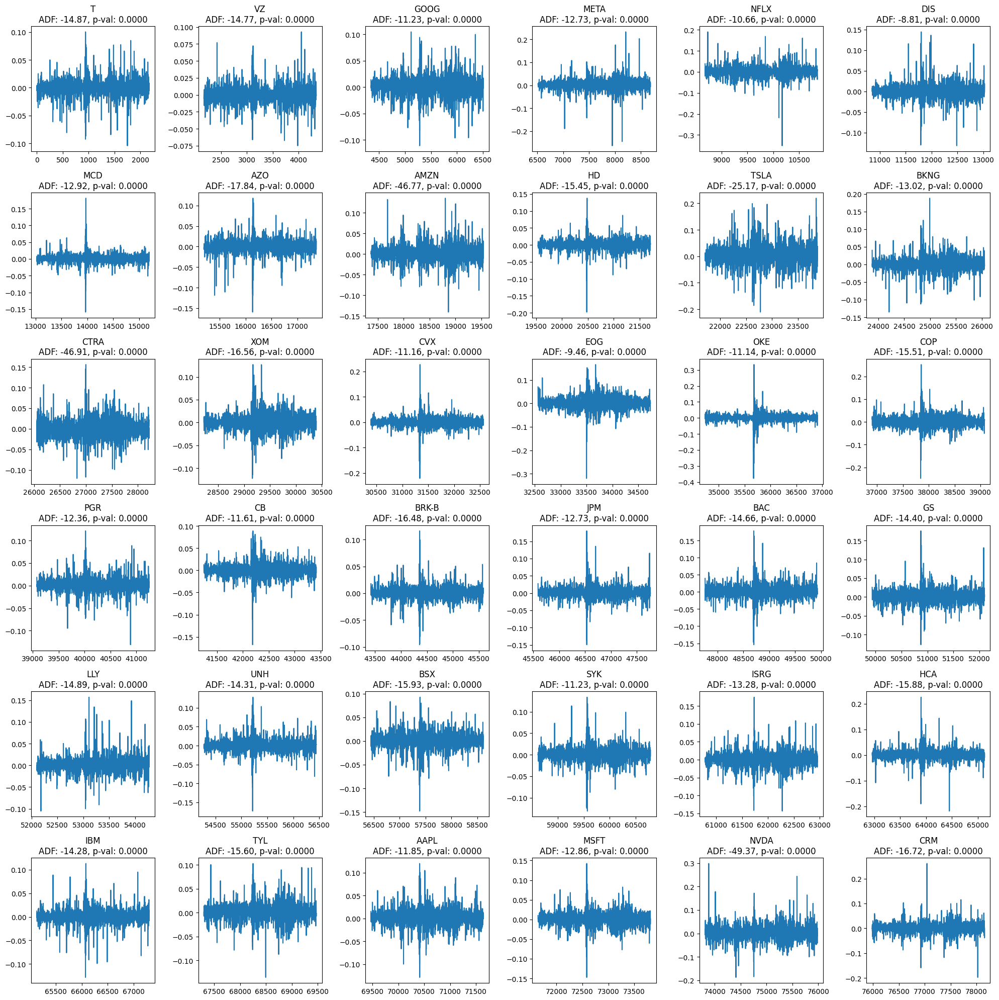

In [6]:
# Initialize a list to store the stationarity results
results_list = []

fig, axes = plt.subplots(nrows=6, ncols=6, figsize=(20, 20))
axes = axes.flatten()  # Flatten the 7x5 array of axes for easy iteration

for i, ticker in enumerate(new_stock_list):
    ax = axes[i]
    # Subset the DataFrame for the current ticker
    df_ticker = df[df['ticker_id'] == ticker].copy()

    # Plot the time series
    df_ticker['close_pctc'].plot(ax=ax, title=f'{ticker} Close Pct Change')
    
    # Run the stationarity check on 'close_pctc'
    stationarity_result = check_stationarity(df_ticker, ['close_pctc'])
    adf_stat = stationarity_result['close_pctc']['ADF Stat']
    p_val = stationarity_result['close_pctc']['p-value']
    
    # Store the results in our list
    results_list.append({
        'ticker': ticker,
        'adf_stat': adf_stat,
        'p_val': p_val
    })
    
    # (Optional) Show p-value (or ADF stat) in the title
    ax.set_title(f'{ticker}\nADF: {adf_stat:.2f}, p-val: {p_val:.4f}')

# Hide any unused subplots if new_stock_list < 35
for j in range(len(new_stock_list), 36):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

In [7]:
def plot_correlation_scatter(ticker_data_dict, new_stock_list, col_name, nrows=6, ncols=6):
    """
    Plots scatter plots with regression lines for multiple tickers showing the correlation 
    between a specified column and close percentage change.

    Parameters:
    - ticker_data_dict: dict, contains ticker-wise DataFrames
    - new_stock_list: list, tickers to be plotted
    - col_name: str, the column to be compared with 'close_pctc'
    - nrows: int, number of rows in the plot grid
    - ncols: int, number of columns in the plot grid
    """
    
    # Initialize the figure with subplots
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(20, 20))
    axes = axes.flatten()  # Flatten for easy iteration

    for i, ticker in enumerate(new_stock_list):
        ax = axes[i]
        
        if ticker in ticker_data_dict:
            df_ticker = ticker_data_dict[ticker].copy()
            
            # Ensure required columns exist
            if col_name in df_ticker.columns and 'close_pctc' in df_ticker.columns:
                # Drop NaN values for correlation calculation
                df_clean = df_ticker[[col_name, 'close_pctc']].dropna()
                
                if not df_clean.empty:
                    # Compute Pearson correlation
                    corr = np.corrcoef(df_clean[col_name], df_clean['close_pctc'])[0, 1]
                else:
                    corr = np.nan  # Avoid errors if data is empty
                
                # Scatter plot with regression line
                sns.regplot(
                    x=df_ticker[col_name], 
                    y=df_ticker['close_pctc'], 
                    scatter=True, 
                    ci=None, 
                    line_kws={'color': 'red'}, 
                    ax=ax
                )
                ax.set_xlabel(f"{col_name} % Change")
                ax.set_ylabel("Close Percentage Change")
                ax.set_title(f"Ticker: {ticker}\nCorr: {corr:.5f}")
            else:
                ax.set_title(f"{ticker} - Data Missing")
                ax.axis("off")  # Hide axes if data is missing
        
    # Hide any unused subplots if new_stock_list < nrows * ncols
    for j in range(len(new_stock_list), nrows * ncols):
        fig.delaxes(axes[j])

    plt.tight_layout()
    plt.show()


In [8]:
# col_name = 'volatility_atr_relative_pctc'  # Specify the desired feature
# plot_correlation_scatter(ticker_data_dict, new_stock_list, col_name)

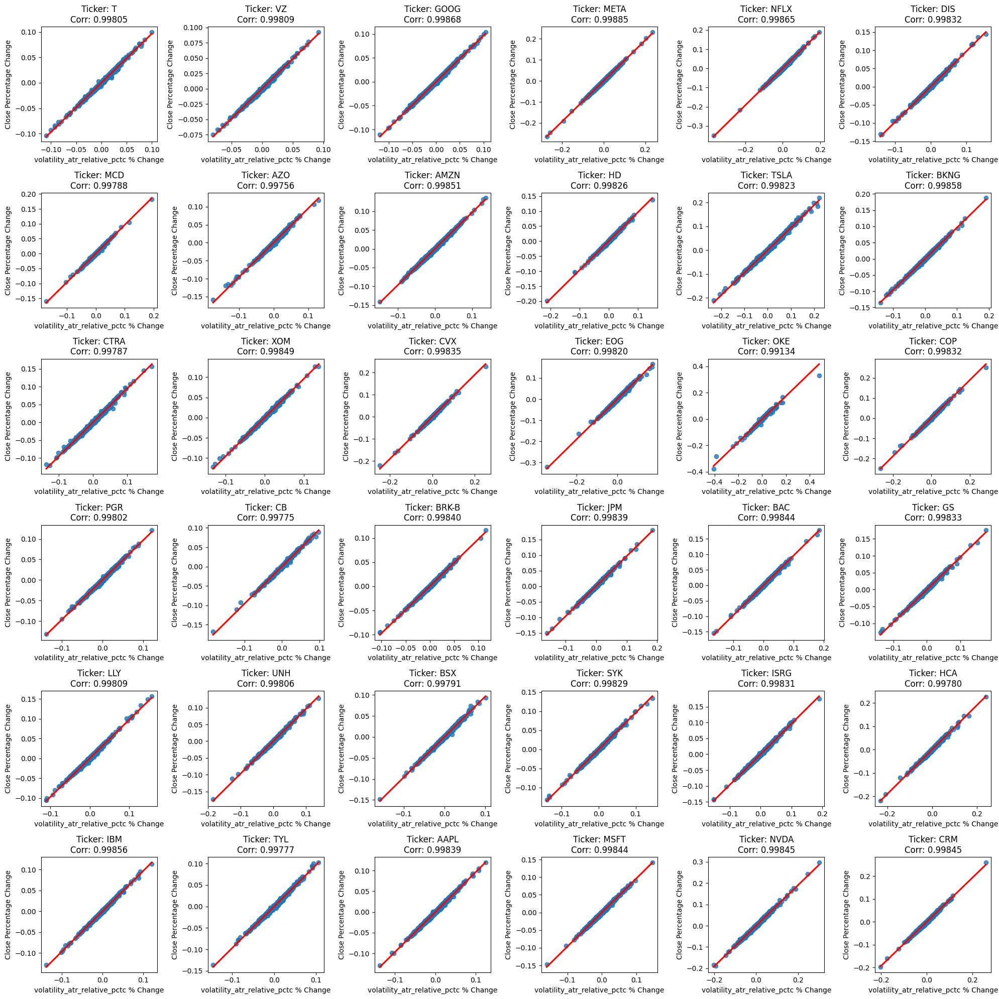

In [9]:
col_name = v_col[1]  # Specify the desired feature
plot_correlation_scatter(ticker_data_dict, new_stock_list, col_name)

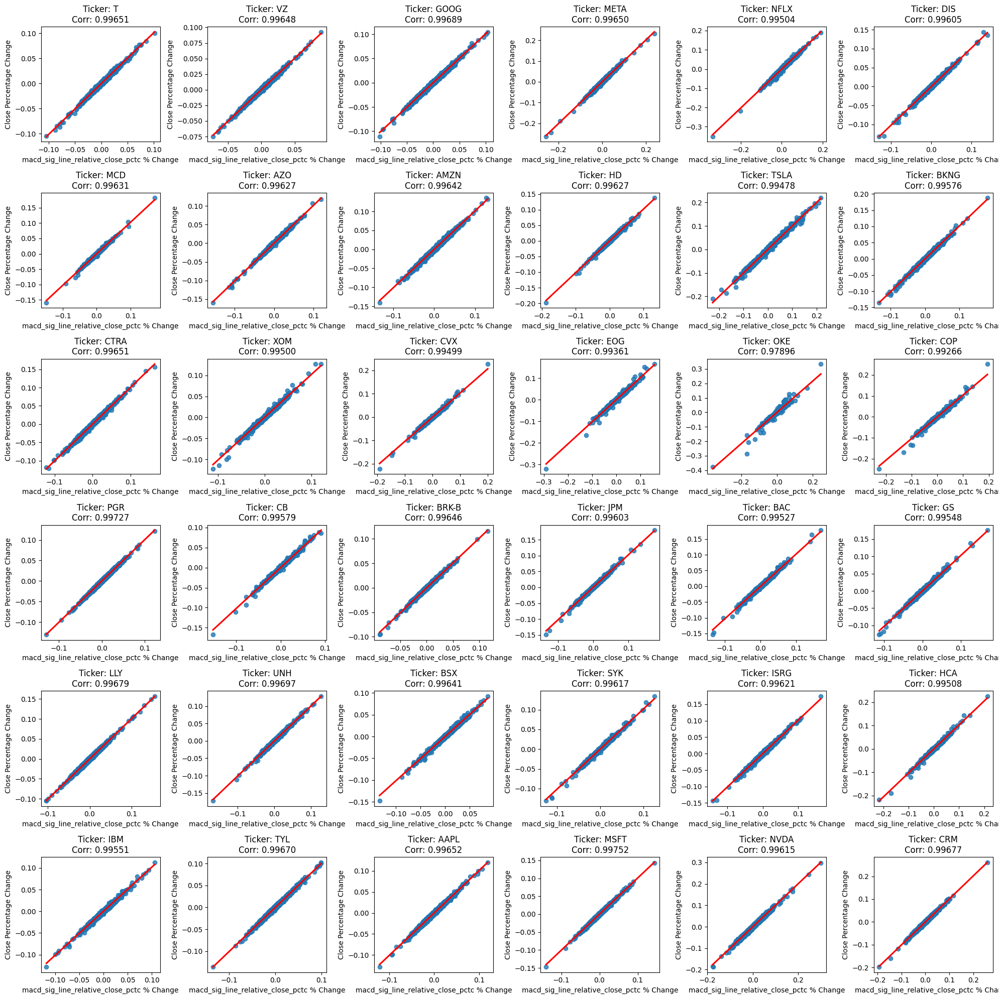

In [10]:
col_name = v_col[2]  # Specify the desired feature
plot_correlation_scatter(ticker_data_dict, new_stock_list, col_name)

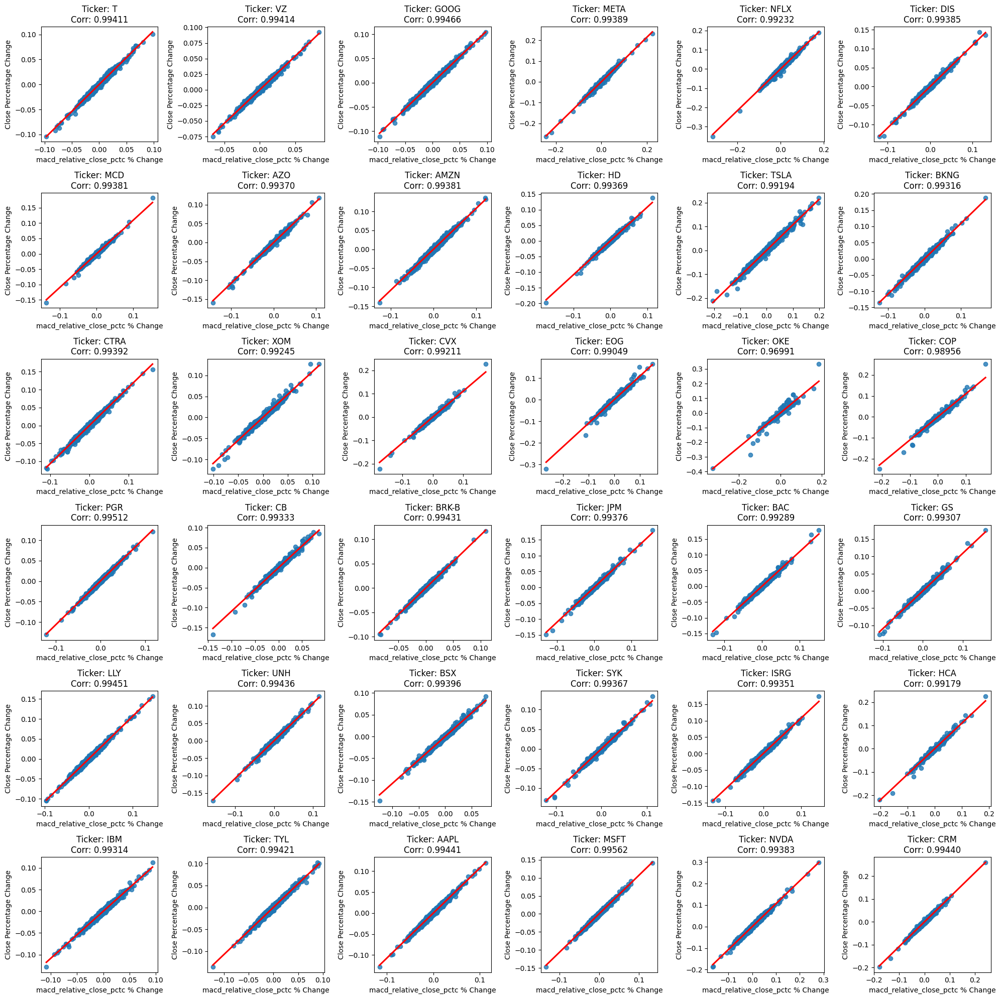

In [11]:
col_name = v_col[3]  # Specify the desired feature
plot_correlation_scatter(ticker_data_dict, new_stock_list, col_name)

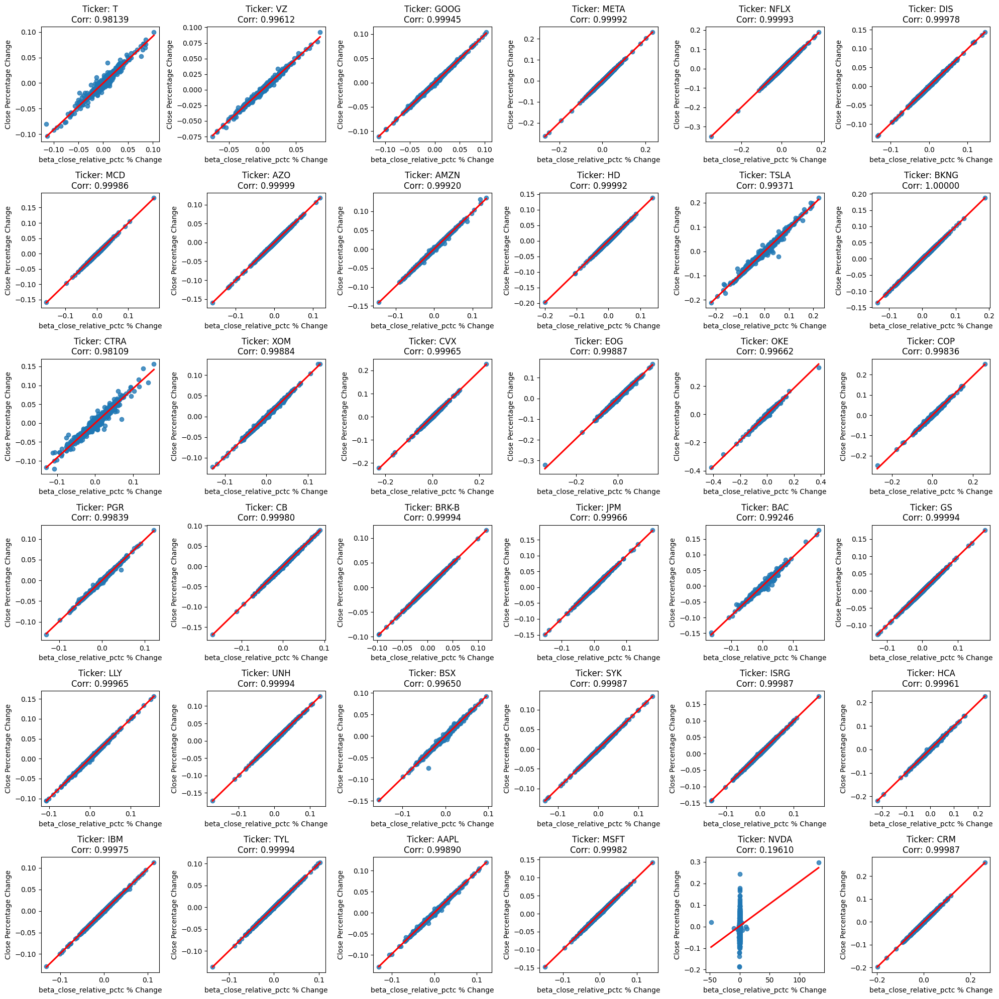

In [12]:
col_name = v_col[4]  # Specify the desired feature
plot_correlation_scatter(ticker_data_dict, new_stock_list, col_name)

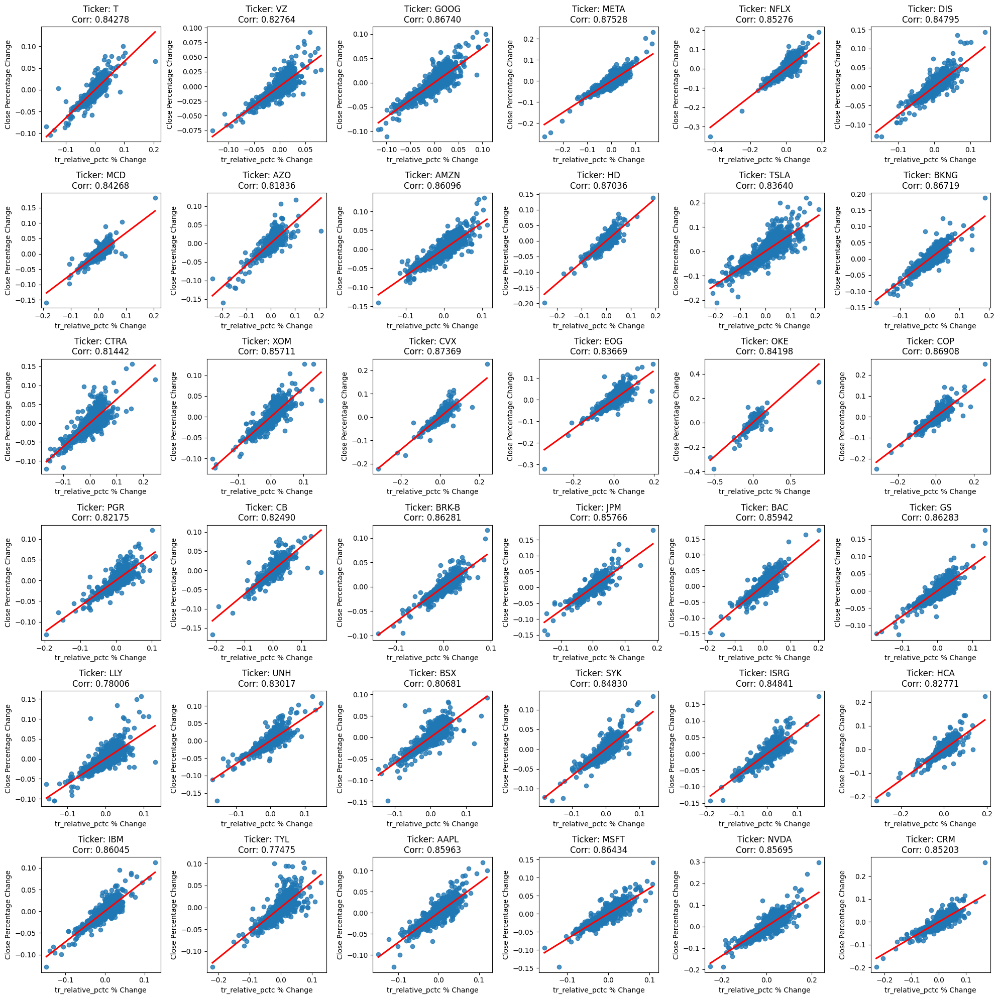

In [13]:
col_name = v_col[5]  # Specify the desired feature
plot_correlation_scatter(ticker_data_dict, new_stock_list, col_name)

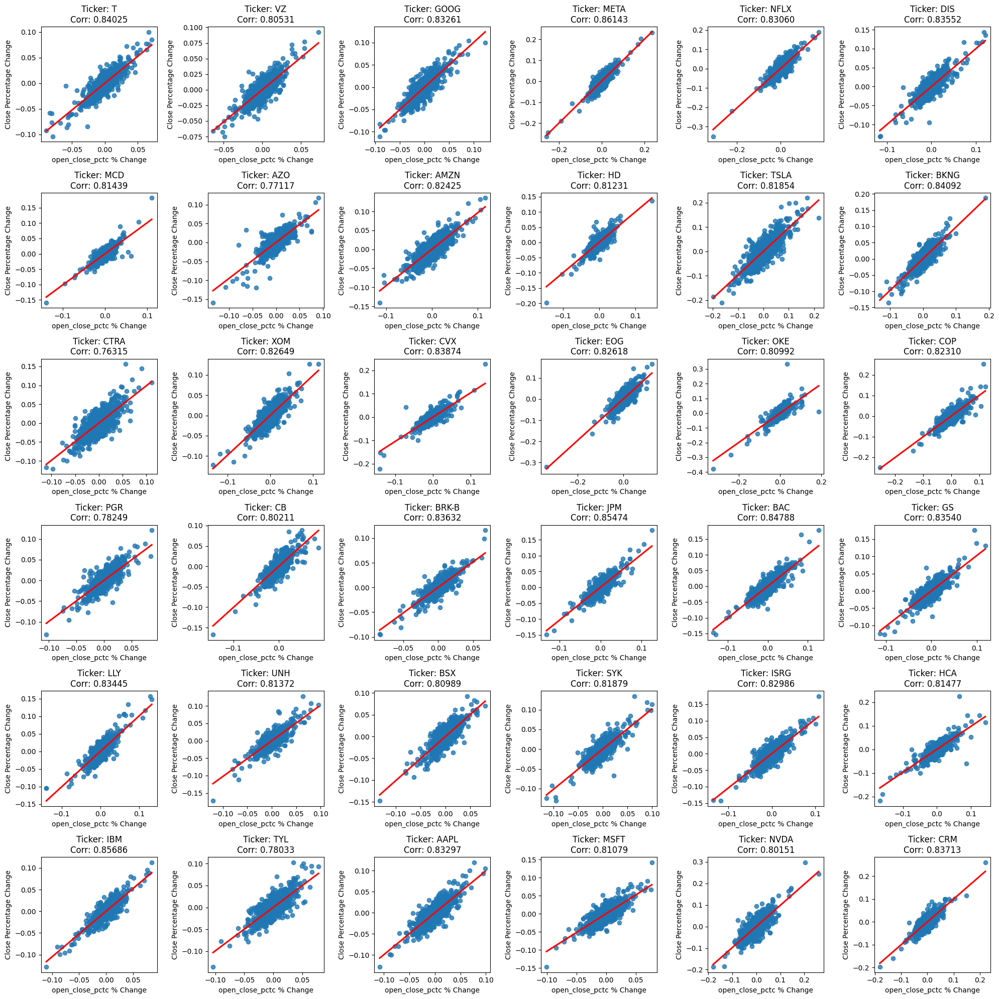

In [14]:
col_name = v_col[6]  # Specify the desired feature
plot_correlation_scatter(ticker_data_dict, new_stock_list, col_name)

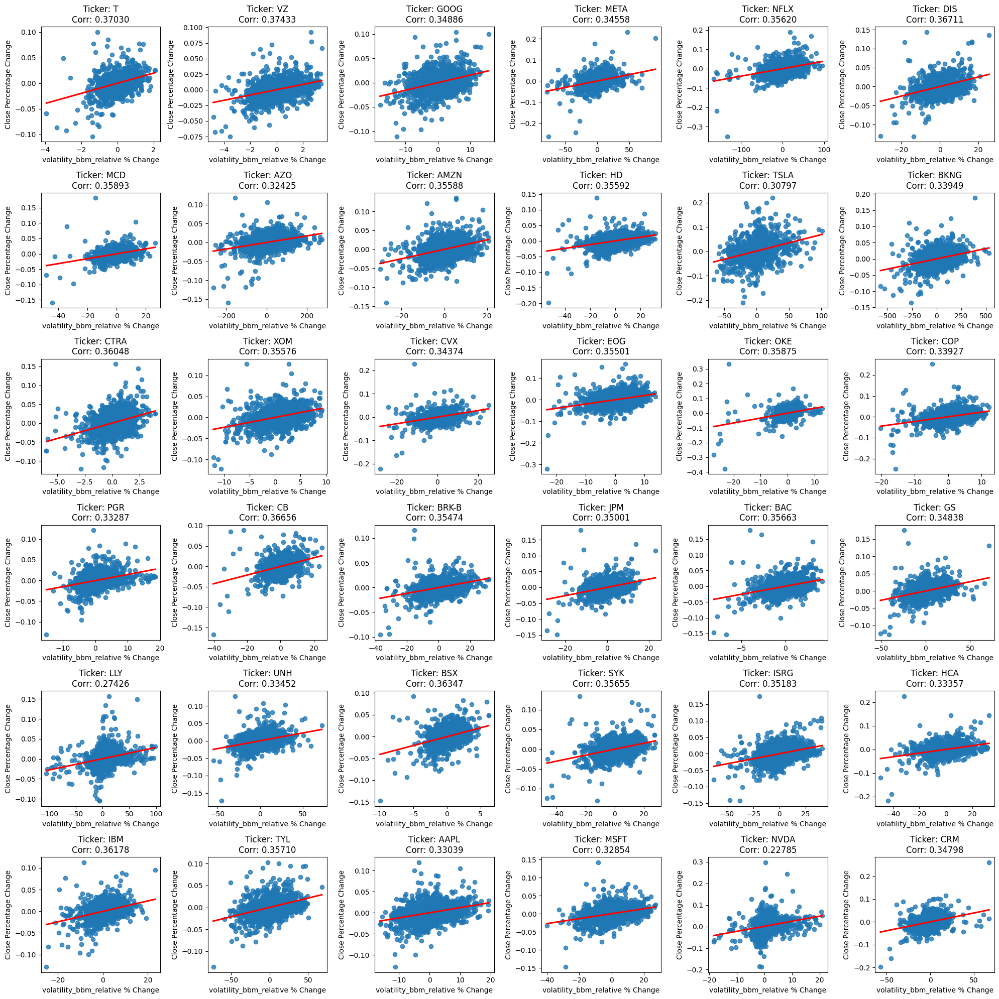

In [15]:
col_name = v_col[7]  # Specify the desired feature
plot_correlation_scatter(ticker_data_dict, new_stock_list, col_name)

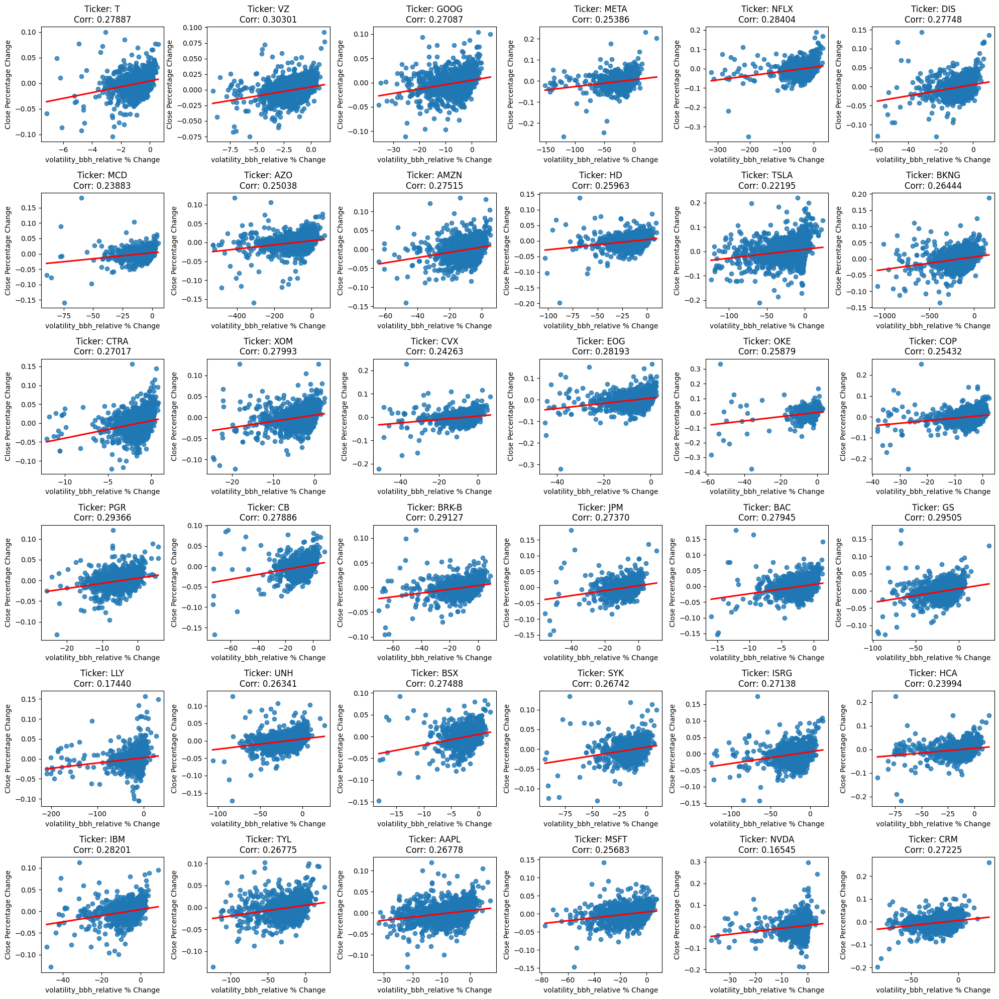

In [16]:
col_name = v_col[8]  # Specify the desired feature
plot_correlation_scatter(ticker_data_dict, new_stock_list, col_name)

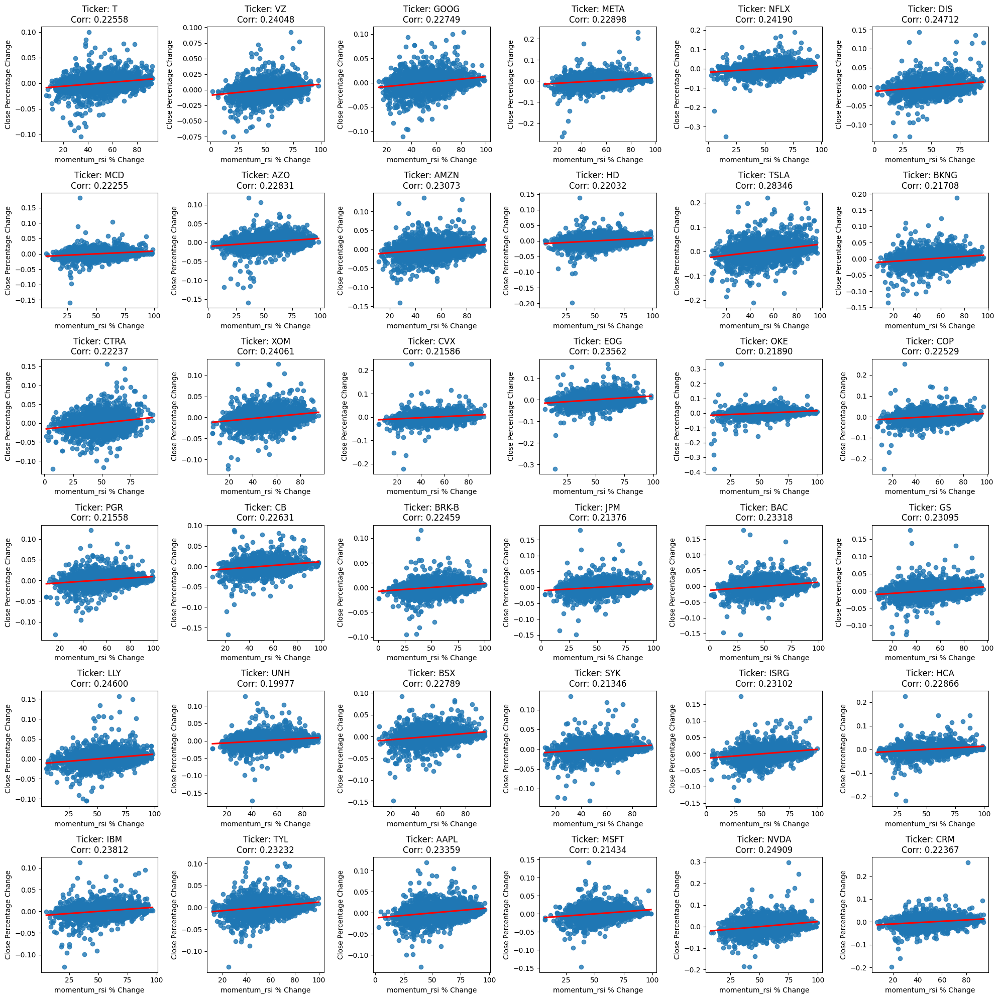

In [17]:
col_name = v_col[9]  # Specify the desired feature
plot_correlation_scatter(ticker_data_dict, new_stock_list, col_name)

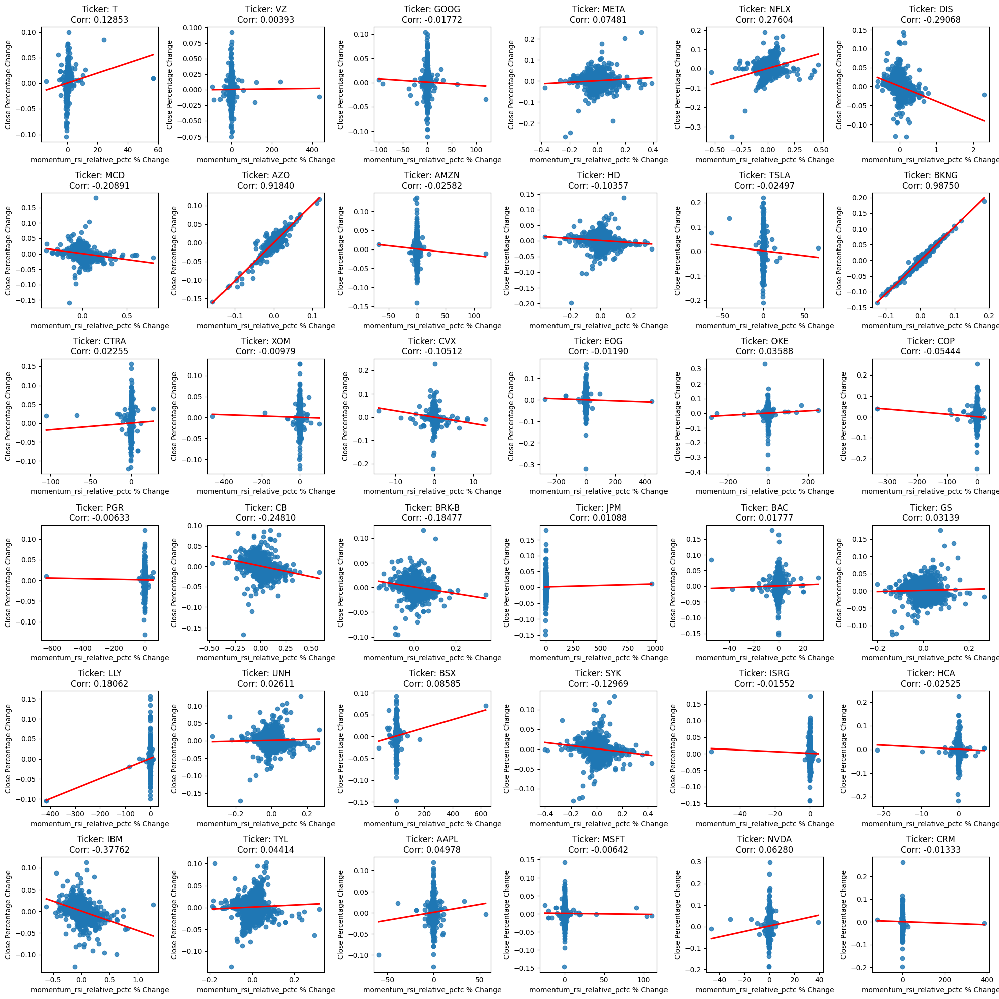

In [18]:
col_name = v_col[10]  # Specify the desired feature
plot_correlation_scatter(ticker_data_dict, new_stock_list, col_name)

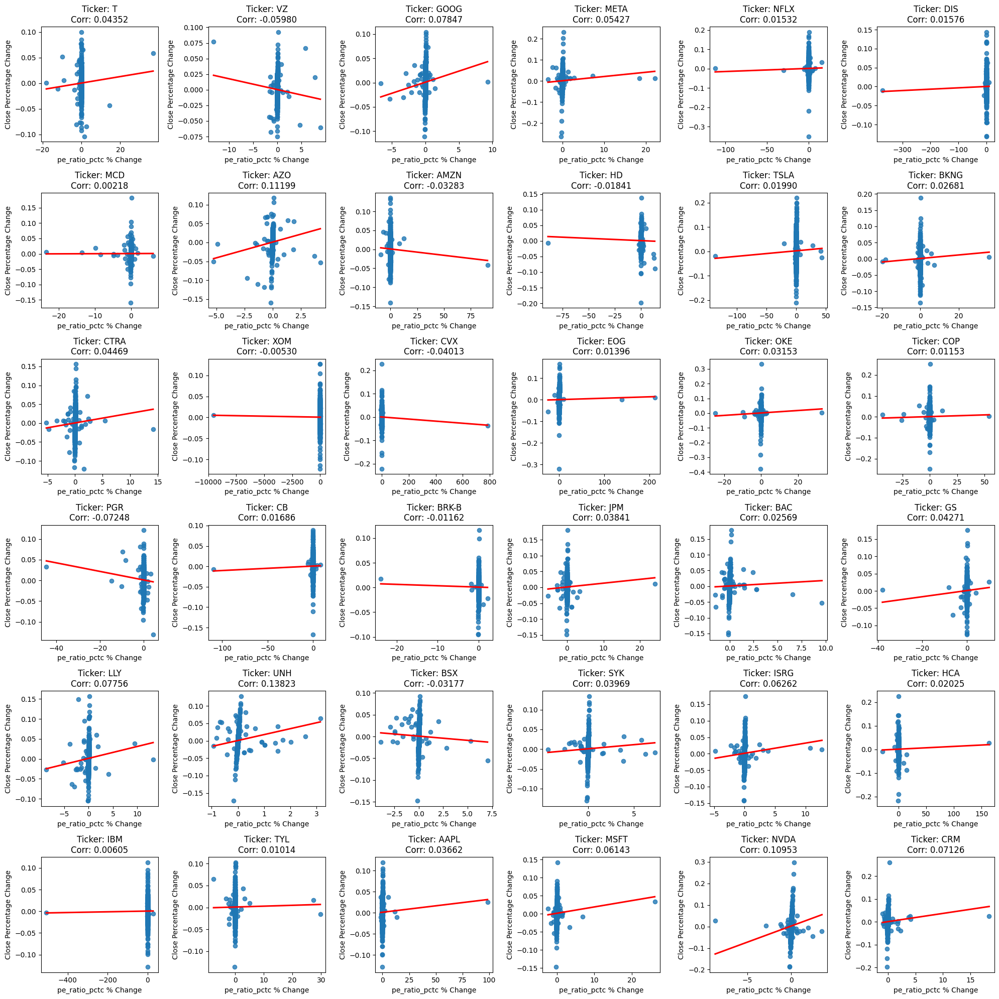

In [19]:
col_name = v_col[11]  # Specify the desired feature
plot_correlation_scatter(ticker_data_dict, new_stock_list, col_name)

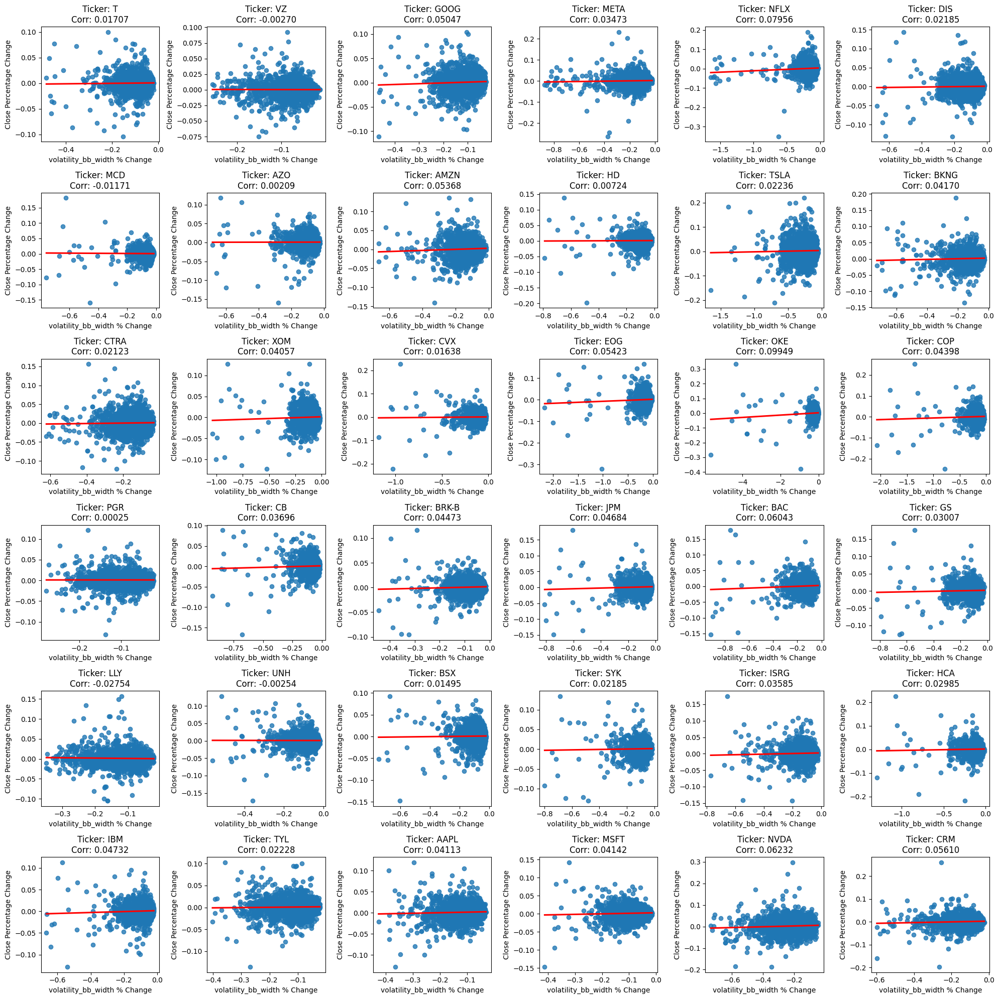

In [20]:
col_name = v_col[12]  # Specify the desired feature
plot_correlation_scatter(ticker_data_dict, new_stock_list, col_name)

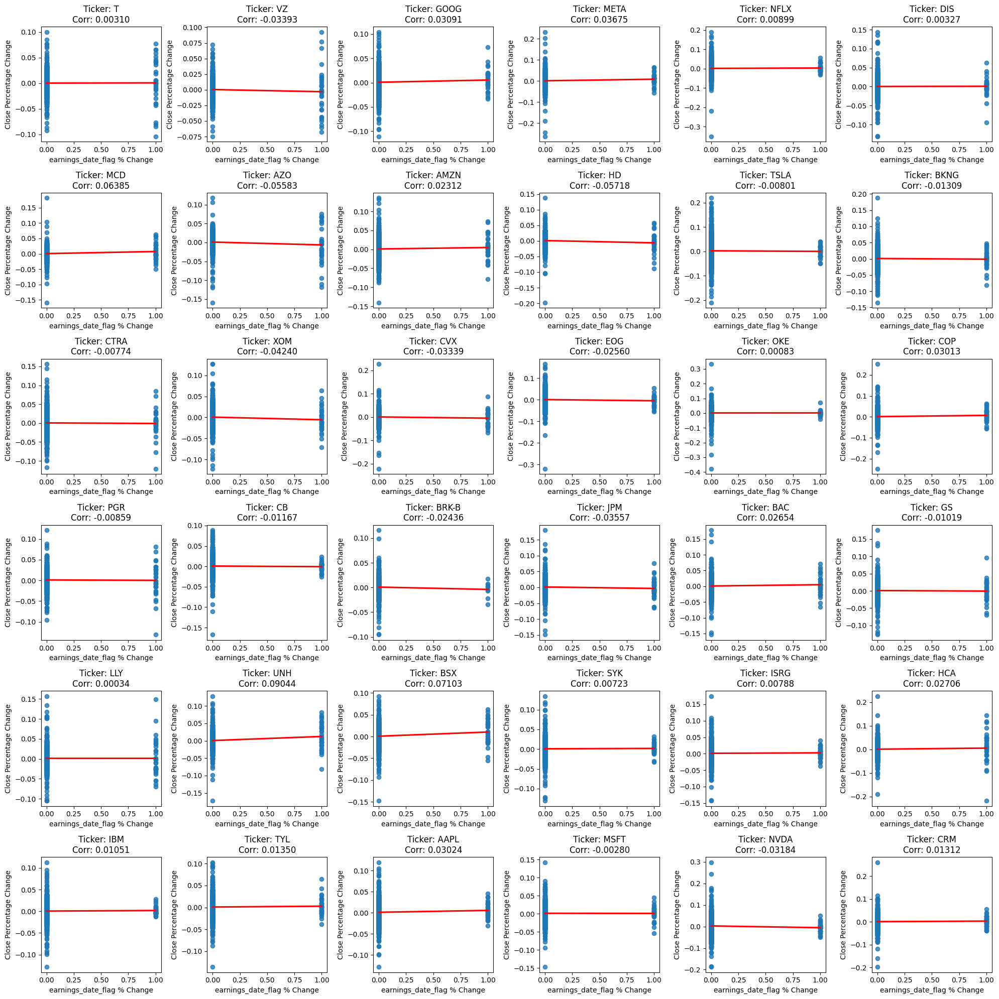

In [21]:
col_name = v_col[13]  # Specify the desired feature
plot_correlation_scatter(ticker_data_dict, new_stock_list, col_name)

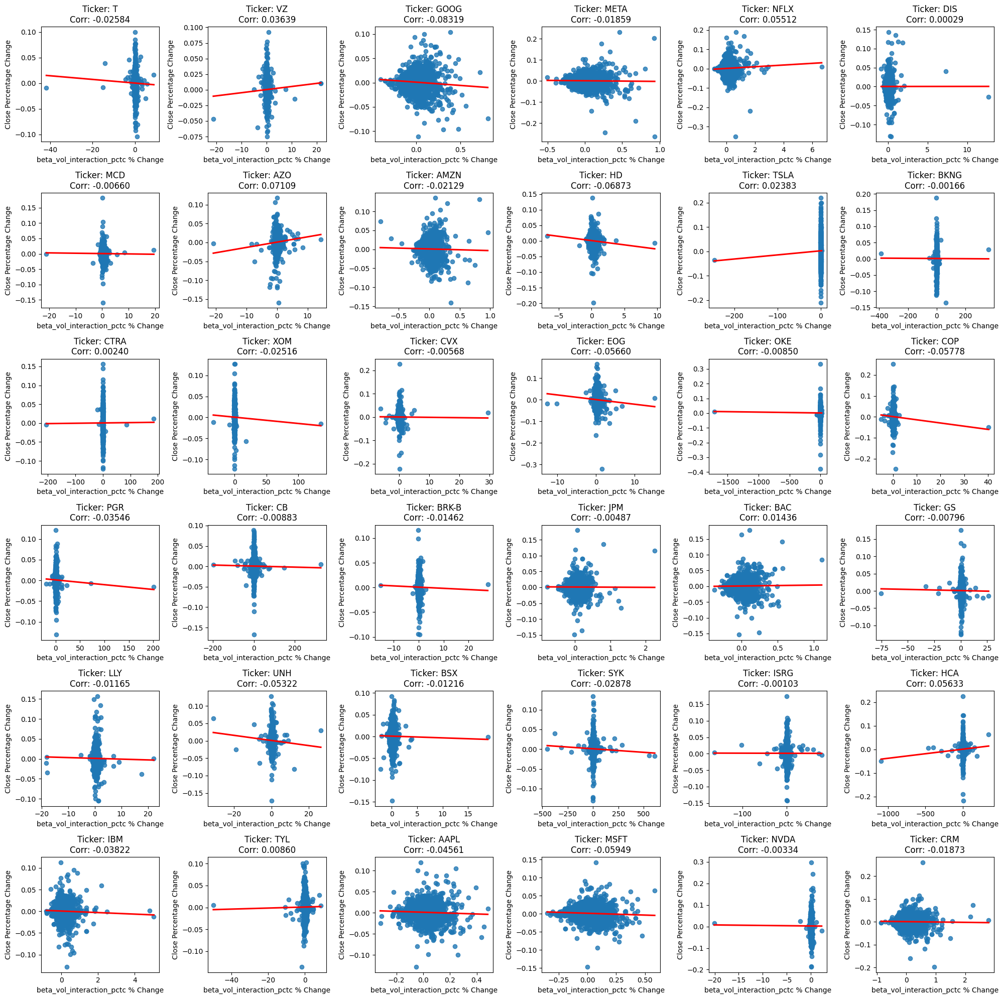

In [22]:
col_name = v_col[14]  # Specify the desired feature
plot_correlation_scatter(ticker_data_dict, new_stock_list, col_name)

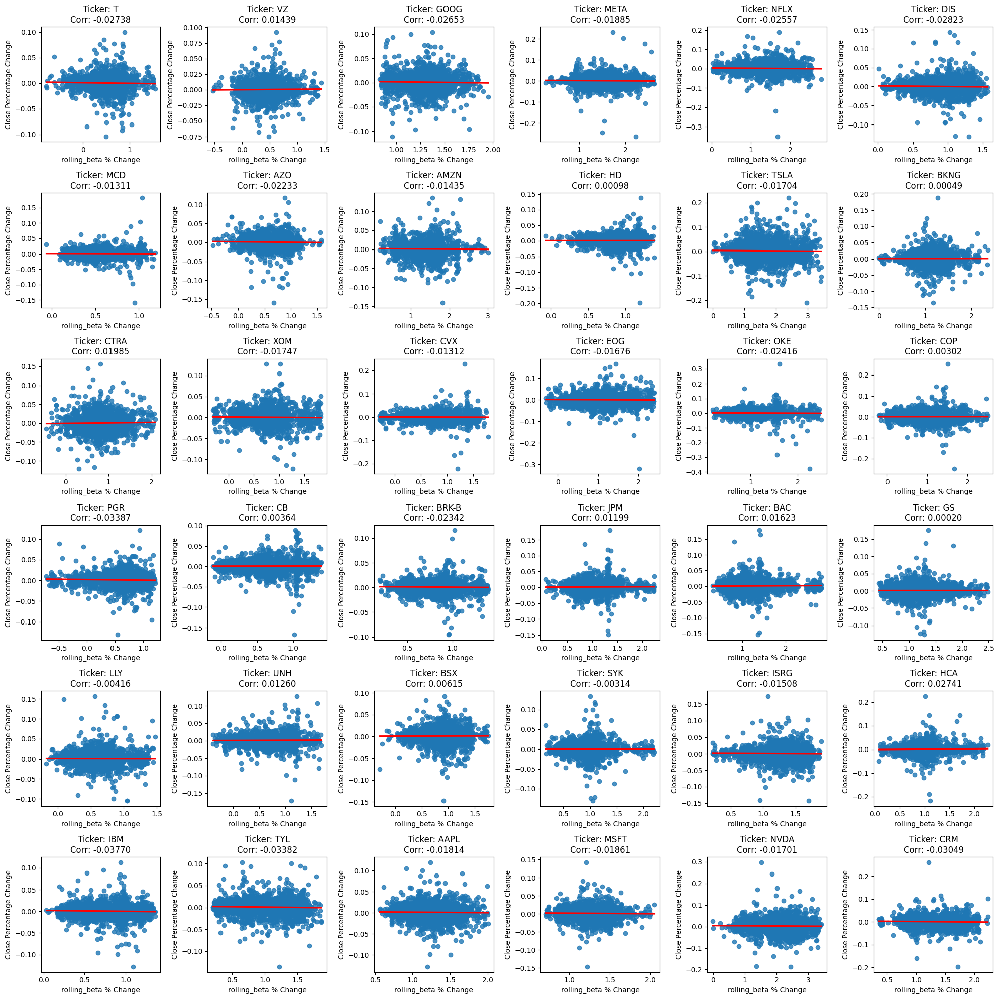

In [23]:
col_name = v_col[15]  # Specify the desired feature
plot_correlation_scatter(ticker_data_dict, new_stock_list, col_name)

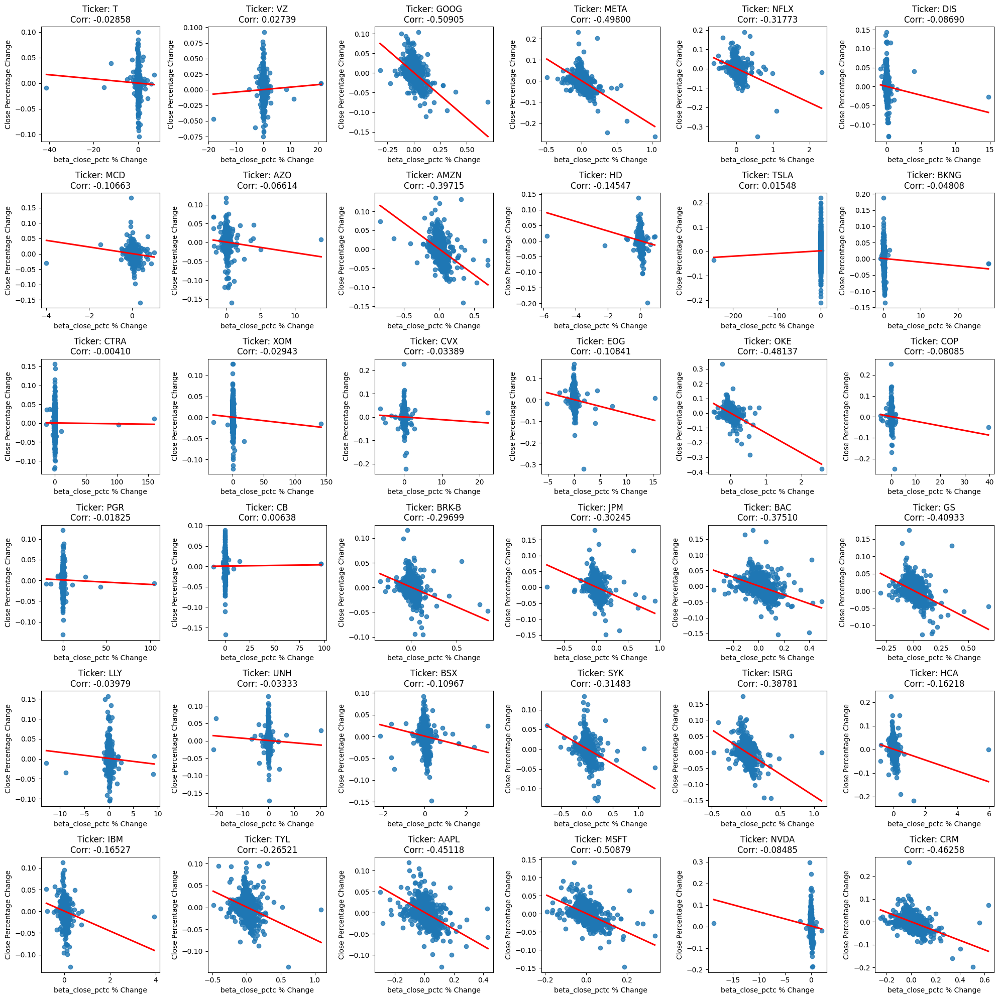

In [24]:
col_name = v_col[16]  # Specify the desired feature
plot_correlation_scatter(ticker_data_dict, new_stock_list, col_name)

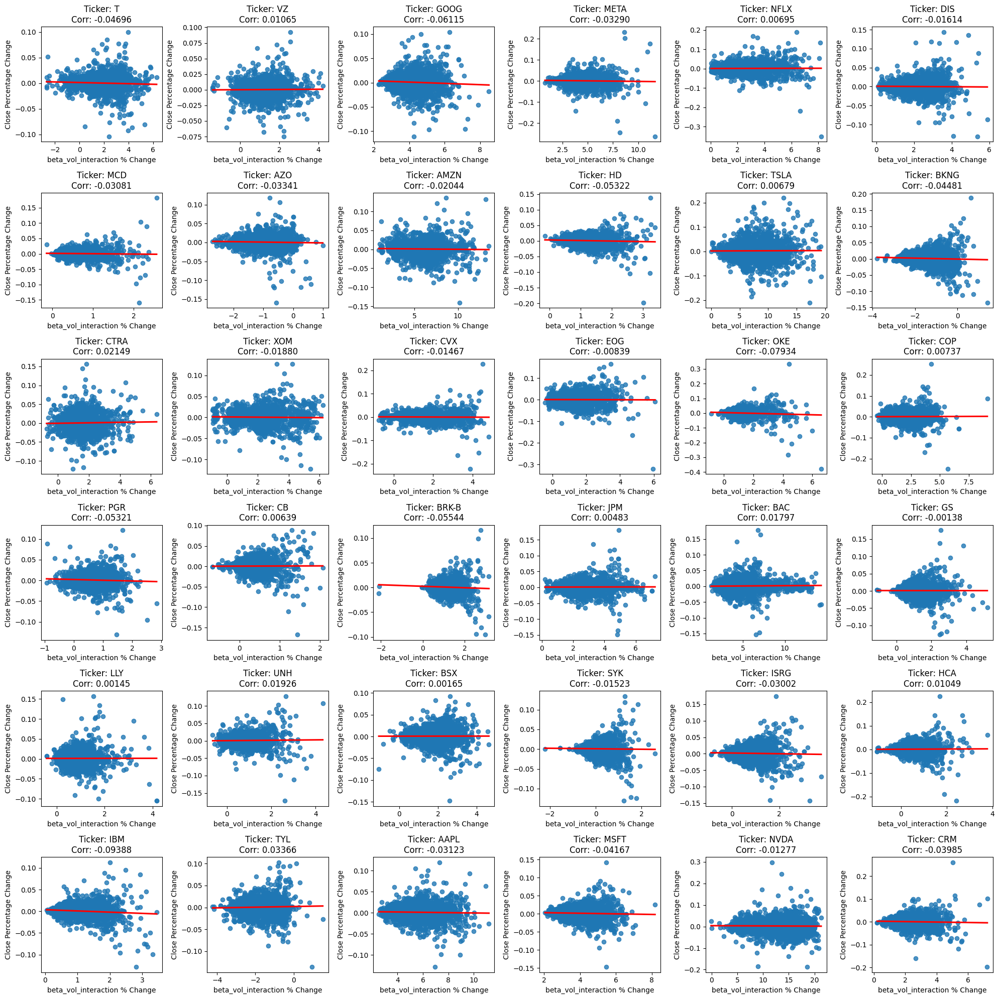

In [25]:
col_name = v_col[17]  # Specify the desired feature
plot_correlation_scatter(ticker_data_dict, new_stock_list, col_name)

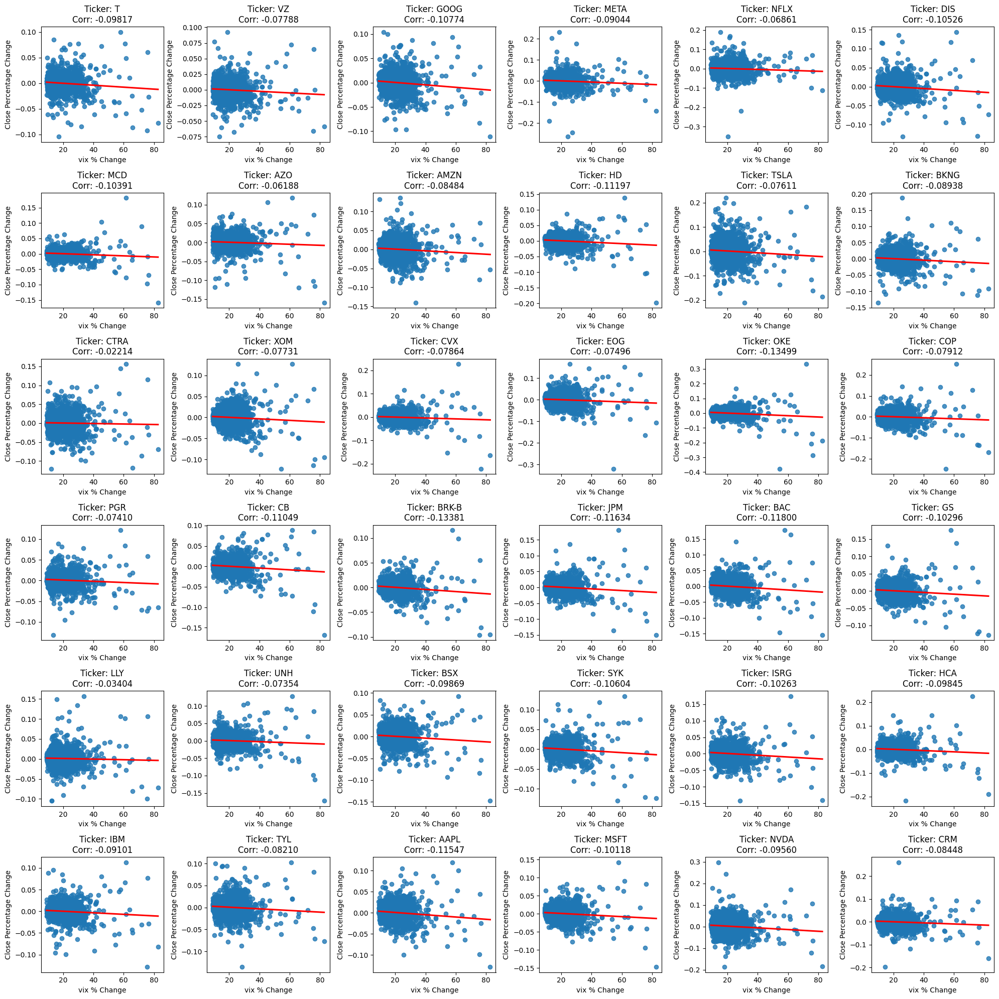

In [26]:
col_name = v_col[18]  # Specify the desired feature
plot_correlation_scatter(ticker_data_dict, new_stock_list, col_name)

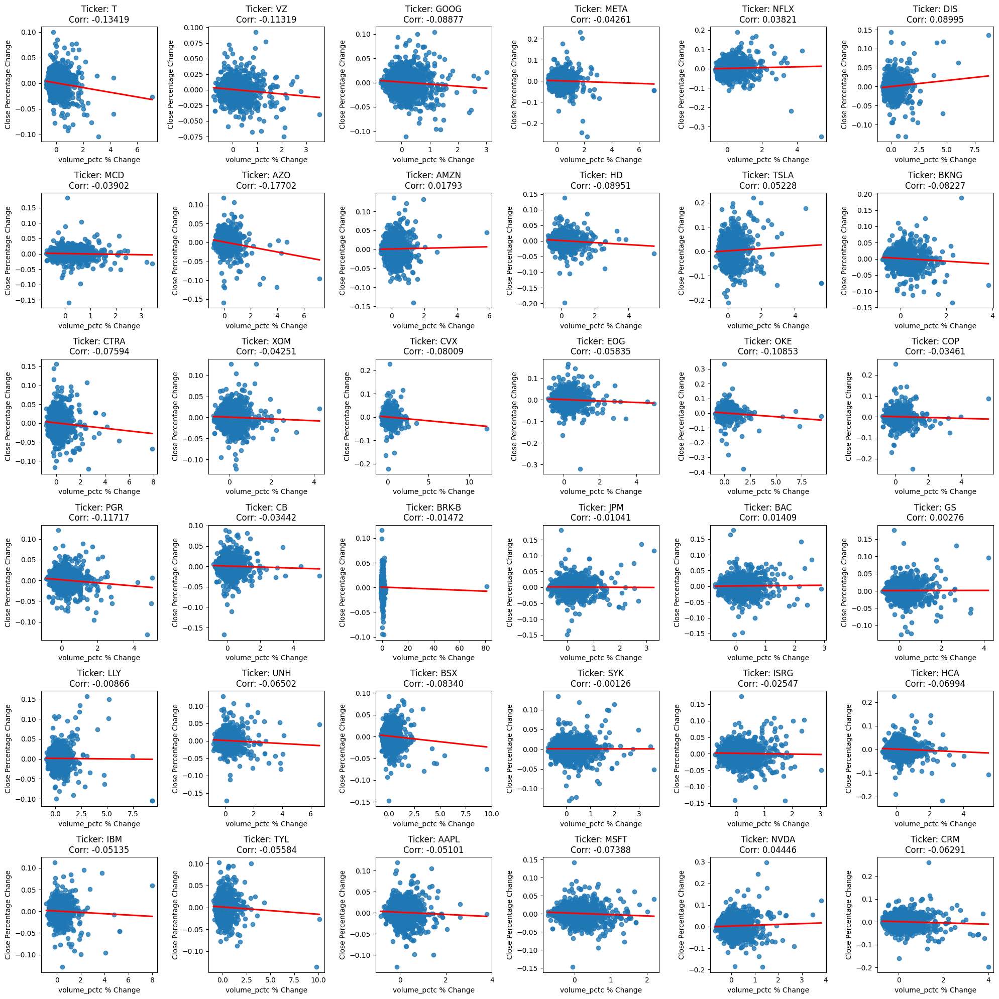

In [27]:
col_name = v_col[19]  # Specify the desired feature
plot_correlation_scatter(ticker_data_dict, new_stock_list, col_name)

In [28]:
corr_df = []
for i, ticker in enumerate(new_stock_list):
    dd = ticker_data_dict[ticker][v_col].corr()[['close_pctc']]
    dd.columns = [ticker]
    corr_df.append(dd)

corr_df_1 = pd.concat(corr_df,axis=1)

corr_df_1.sort_values(by='T', ascending=False).head(12)

,T,VZ,GOOG,META,NFLX,DIS,MCD,AZO,AMZN,HD,TSLA,BKNG,CTRA,XOM,CVX,EOG,OKE,COP,PGR,CB,BRK-B,JPM,BAC,GS,LLY,UNH,BSX,SYK,ISRG,HCA,IBM,TYL,AAPL,MSFT,NVDA,CRM
close_pctc,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
volatility_atr_relative_pctc,0.9981,0.9981,0.9987,0.9989,0.9986,0.9983,0.9979,0.9976,0.9985,0.9983,0.9982,0.9986,0.9979,0.9985,0.9984,0.9982,0.9913,0.9983,0.9980,0.9977,0.9984,0.9984,0.9984,0.9983,0.9981,0.9981,0.9979,0.9983,0.9983,0.9978,0.9986,0.9978,0.9984,0.9984,0.9984,0.9984
macd_sig_line_relative_close_pctc,0.9965,0.9965,0.9969,0.9965,0.9950,0.9960,0.9963,0.9963,0.9964,0.9963,0.9948,0.9958,0.9965,0.9950,0.9950,0.9936,0.9790,0.9927,0.9973,0.9958,0.9965,0.9960,0.9953,0.9955,0.9968,0.9970,0.9964,0.9962,0.9962,0.9951,0.9955,0.9967,0.9965,0.9975,0.9961,0.9968
macd_relative_close_pctc,0.9941,0.9941,0.9947,0.9939,0.9923,0.9938,0.9938,0.9937,0.9938,0.9937,0.9919,0.9932,0.9939,0.9924,0.9921,0.9905,0.9699,0.9896,0.9951,0.9933,0.9943,0.9938,0.9929,0.9931,0.9945,0.9944,0.9940,0.9937,0.9935,0.9918,0.9931,0.9942,0.9944,0.9956,0.9938,0.9944
beta_close_relative_pctc,0.9814,0.9961,0.9994,0.9999,0.9999,0.9998,0.9999,1.0000,0.9992,0.9999,0.9937,1.0000,0.9811,0.9988,0.9996,0.9989,0.9966,0.9984,0.9984,0.9998,0.9999,0.9997,0.9925,0.9999,0.9997,0.9999,0.9965,0.9999,0.9999,0.9996,0.9997,0.9999,0.9989,0.9998,0.1961,0.9999
tr_relative_pctc,0.8428,0.8276,0.8674,0.8753,0.8528,0.8480,0.8427,0.8184,0.8610,0.8704,0.8364,0.8672,0.8144,0.8571,0.8737,0.8367,0.8420,0.8691,0.8217,0.8249,0.8628,0.8577,0.8594,0.8628,0.7801,0.8302,0.8068,0.8483,0.8484,0.8277,0.8605,0.7748,0.8596,0.8643,0.8569,0.8520
open_close_pctc,0.8402,0.8053,0.8326,0.8614,0.8306,0.8355,0.8144,0.7712,0.8243,0.8123,0.8185,0.8409,0.7631,0.8265,0.8387,0.8262,0.8099,0.8231,0.7825,0.8021,0.8363,0.8547,0.8479,0.8354,0.8345,0.8137,0.8099,0.8188,0.8299,0.8148,0.8569,0.7803,0.8330,0.8108,0.8015,0.8371
volatility_bbm_relative,0.3703,0.3743,0.3489,0.3456,0.3562,0.3671,0.3589,0.3242,0.3559,0.3559,0.3080,0.3395,0.3605,0.3558,0.3437,0.3550,0.3587,0.3393,0.3329,0.3666,0.3547,0.3500,0.3566,0.3484,0.2743,0.3345,0.3635,0.3565,0.3518,0.3336,0.3618,0.3571,0.3304,0.3285,0.2278,0.3480
volatility_bbh_relative,0.2789,0.3030,0.2709,0.2539,0.2840,0.2775,0.2388,0.2504,0.2751,0.2596,0.2220,0.2644,0.2702,0.2799,0.2426,0.2819,0.2588,0.2543,0.2937,0.2789,0.2913,0.2737,0.2794,0.2950,0.1744,0.2634,0.2749,0.2674,0.2714,0.2399,0.2820,0.2677,0.2678,0.2568,0.1654,0.2722
momentum_rsi,0.2256,0.2405,0.2275,0.2290,0.2419,0.2471,0.2225,0.2283,0.2307,0.2203,0.2835,0.2171,0.2224,0.2406,0.2159,0.2356,0.2189,0.2253,0.2156,0.2263,0.2246,0.2138,0.2332,0.2309,0.2460,0.1998,0.2279,0.2135,0.2310,0.2287,0.2381,0.2323,0.2336,0.2143,0.2491,0.2237


In [29]:
testing_1 = list(corr_df_1.sort_values(by='T', ascending=False).head(12).index)
testing_1 = testing_1 + list(non_float_columns) + ['close']

In [30]:
testing_1

['close_pctc',
 'volatility_atr_relative_pctc',
 'macd_sig_line_relative_close_pctc',
 'macd_relative_close_pctc',
 'beta_close_relative_pctc',
 'tr_relative_pctc',
 'open_close_pctc',
 'volatility_bbm_relative',
 'volatility_bbh_relative',
 'momentum_rsi',
 'momentum_rsi_relative_pctc',
 'pe_ratio_pctc',
 'date',
 'ticker_id',
 'sector',
 'close']

In [58]:
mp  = pd.read_csv('mini_portfolios_0219.csv')
mp_mapper = {w : s for w,s in zip(mp.Ticker, mp.Sector)}



In [90]:
for_bp  = df[['sector','ticker_id','date','close_pctc']].copy()

# Convert 'date' column to datetime format
for_bp['date'] = pd.to_datetime(for_bp['date'])
#for_bp = for_bp.sort_values(by=['sector']).reset_index(drop=True)
for_bp['name'] = for_bp['sector'] +'_'+for_bp['ticker_id']

df_2018 = for_bp[for_bp['date'].dt.year == 2018].reset_index(drop=True)
df_2018['year'] = '2018'
df_2018['name_year'] = df_2018['name']+'_'+ df_2018['year']

df_2020 = for_bp[for_bp['date'].dt.year == 2020].reset_index(drop=True)
df_2020['year'] = '2020'
df_2020['name_year'] = df_2020['name']+'_'+ df_2020['year']

df_2022 = for_bp[for_bp['date'].dt.year == 2022].reset_index(drop=True)
df_2022['year'] = '2022'
df_2022['name_year'] = df_2022['name']+'_'+ df_2022['year']

df_2023 = for_bp[for_bp['date'].dt.year == 2023].reset_index(drop=True)
df_2023['year'] = '2023'
df_2023['name_year'] = df_2023['name']+'_'+ df_2023['year']

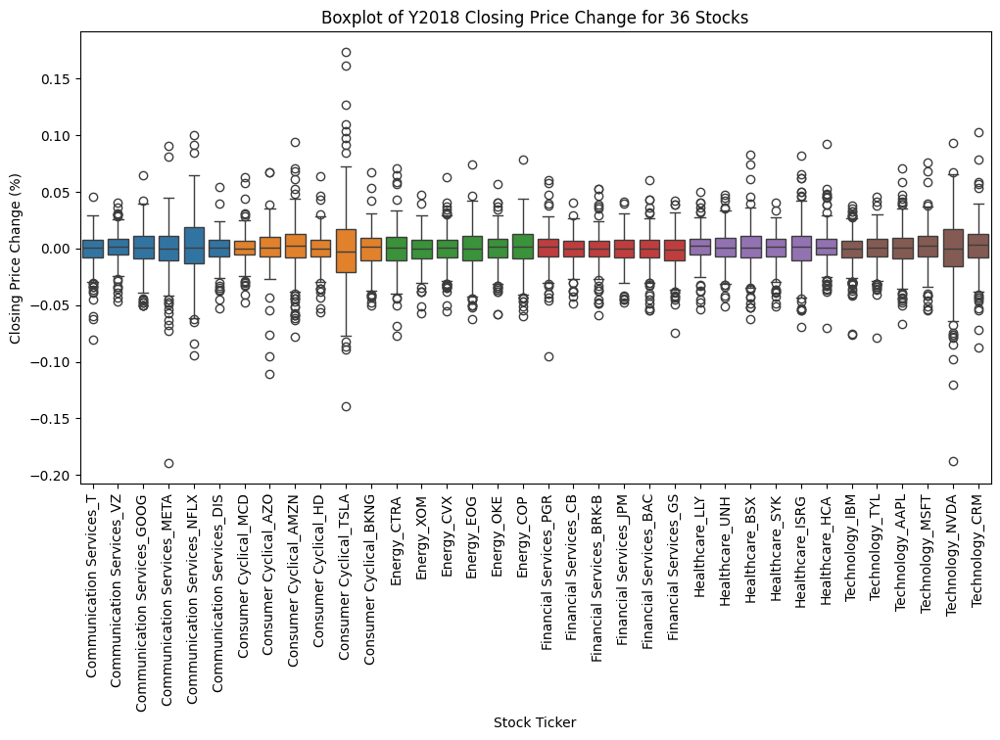

In [91]:
# Generate a boxplot
plt.figure(figsize=(12, 6))
sns.boxplot(x=df_2018['name'], y=df_2018["close_pctc"], hue=df_2018['sector'])

# Remove the legend
plt.legend().remove()

# Labels and title
plt.xlabel("Stock Ticker")
plt.ylabel("Closing Price Change (%)")
plt.title("Boxplot of Y2018 Closing Price Change for 36 Stocks")
plt.xticks(rotation=90)  # Rotate ticker labels for better visibility

# Show the plot
plt.show()

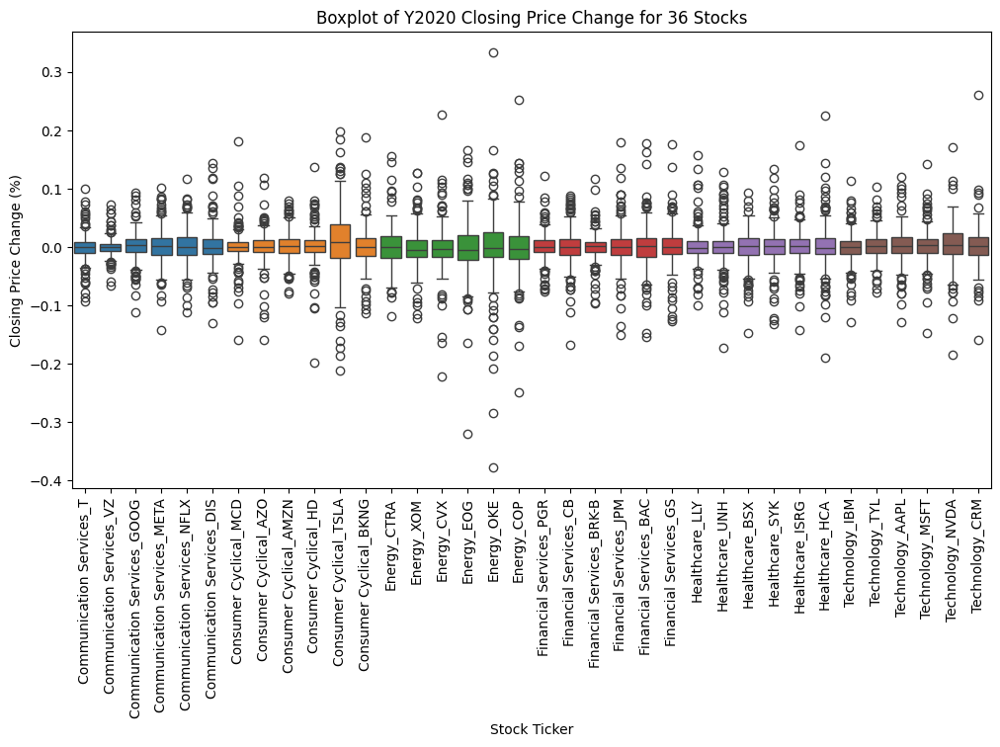

In [92]:
# Generate a boxplot
plt.figure(figsize=(12, 6))
sns.boxplot(x=df_2020['name'], y=df_2020["close_pctc"], hue=df_2020['sector'])

# Remove the legend
plt.legend().remove()

# Labels and title
plt.xlabel("Stock Ticker")
plt.ylabel("Closing Price Change (%)")
plt.title("Boxplot of Y2020 Closing Price Change for 36 Stocks")
plt.xticks(rotation=90)  # Rotate ticker labels for better visibility

# Show the plot
plt.show()

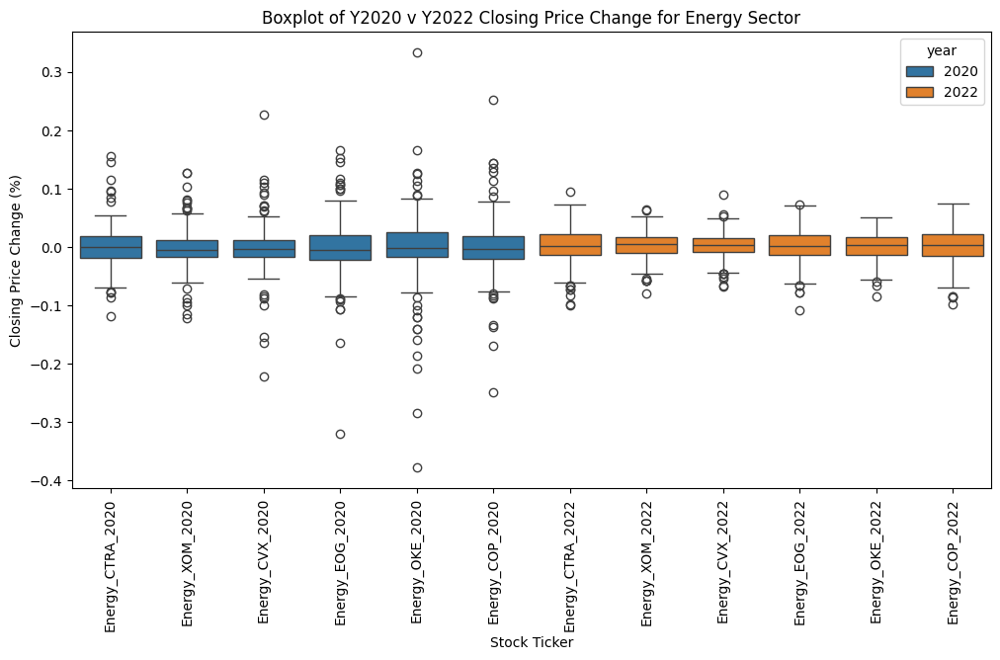

In [95]:
d22 = df_2022[df_2022['sector'] == 'Energy'].reset_index(drop=True)
d20 = df_2020[df_2020['sector'] == 'Energy'].reset_index(drop=True)

energy = pd.concat([d20,d22], axis = 0).reset_index(drop=True)

# Generate a boxplot
plt.figure(figsize=(12, 6))
sns.boxplot(x=energy['name_year'], y=energy["close_pctc"], hue=energy['year'])

# Labels and title
plt.xlabel("Stock Ticker")
plt.ylabel("Closing Price Change (%)")
plt.title("Boxplot of Y2020 v Y2022 Closing Price Change for Energy Sector")
plt.xticks(rotation=90)  # Rotate ticker labels for better visibility

# Show the plot
plt.show()

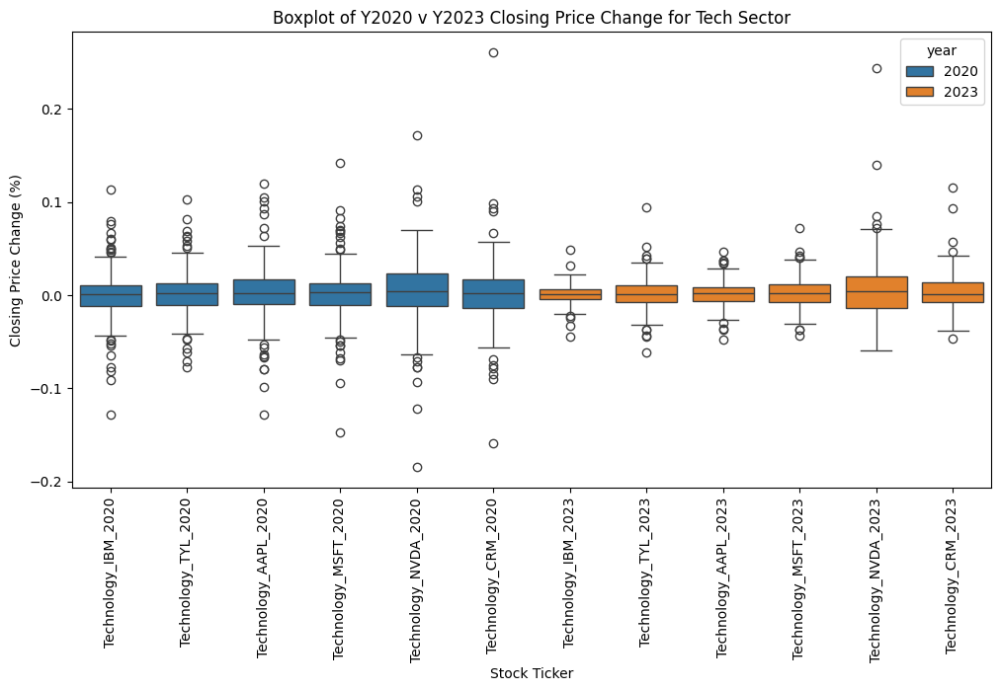

In [97]:
d23 = df_2023[df_2023['sector'] == 'Technology'].reset_index(drop=True)
d20 = df_2020[df_2020['sector'] == 'Technology'].reset_index(drop=True)

energy = pd.concat([d20,d23], axis = 0).reset_index(drop=True)

# Generate a boxplot
plt.figure(figsize=(12, 6))
sns.boxplot(x=energy['name_year'], y=energy["close_pctc"], hue=energy['year'])

# Labels and title
plt.xlabel("Stock Ticker")
plt.ylabel("Closing Price Change (%)")
plt.title("Boxplot of Y2020 v Y2023 Closing Price Change for Tech Sector")
plt.xticks(rotation=90)  # Rotate ticker labels for better visibility

# Show the plot
plt.show()